In [158]:
import wfdb
import numpy as np
import pywt
import matplotlib.pyplot as plt
from ecgdetectors import Detectors
from scipy.signal import medfilt

In [159]:
record = wfdb.rdrecord('./data/scddb/30')

In [160]:
record.__dict__

{'record_name': '30',
 'n_sig': 2,
 'fs': 250,
 'counter_freq': None,
 'base_counter': None,
 'sig_len': 22099250,
 'base_time': datetime.time(12, 0),
 'base_date': None,
 'comments': ['Produced by xform_new from record 30, beginning at 26:35.000',
  'vfon: 07:54:33'],
 'sig_name': ['ECG', 'ECG'],
 'p_signal': array([[ 0.06375,  0.18125],
        [ 0.0725 ,  0.1875 ],
        [ 0.08375,  0.1925 ],
        ...,
        [-0.985  , -0.9625 ],
        [-1.     , -0.965  ],
        [-0.9925 , -0.95   ]]),
 'd_signal': None,
 'e_p_signal': None,
 'e_d_signal': None,
 'file_name': ['30.dat', '30.dat'],
 'fmt': ['212', '212'],
 'samps_per_frame': [1, 1],
 'skew': [None, None],
 'byte_offset': [None, None],
 'adc_gain': [800.0, 800.0],
 'baseline': [0, 0],
 'units': ['mV', 'mV'],
 'adc_res': [12, 12],
 'adc_zero': [0, 0],
 'init_value': [51, 145],
 'checksum': [-24065, 21051],
 'block_size': [0, 0]}

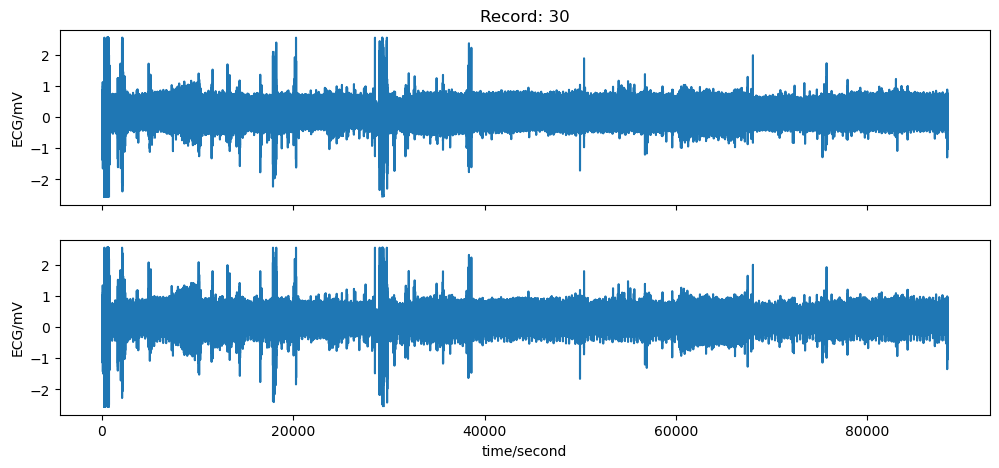

In [161]:
wfdb.plot_wfdb(record=record, 
               plot_sym=True,
               time_units='seconds', 
               title='',
               figsize=(12,5), 
               ecg_grids='')

In [162]:
signal = record.p_signal[:, 0]

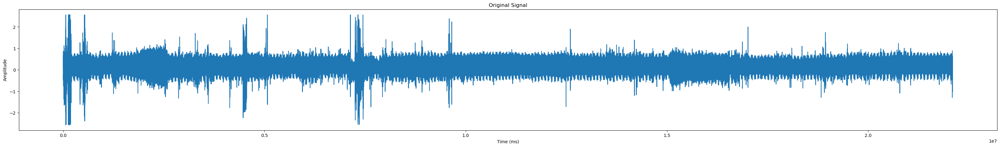

In [163]:
plt.figure(figsize=(40, 5))
#plt.subplot()
plt.plot(signal)
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

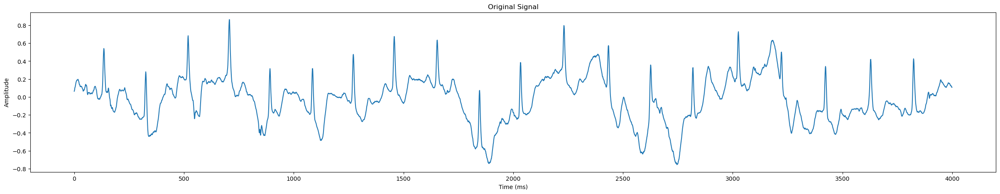

In [164]:
plt.figure(figsize=(30, 5))
plt.subplot()
plt.plot(signal[:4000])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

In [165]:
fs = record.fs
segment_duration = 5 * 60  # 5 minutes in seconds
samples_per_segment = fs * segment_duration

print(f"""
fs = {fs}
segment_duration = {segment_duration}
samples_per_segment = {samples_per_segment}
""")


fs = 250
segment_duration = 300
samples_per_segment = 75000



In [166]:
signal.shape

(22099250,)

In [167]:
22099250 / samples_per_segment 

294.6566666666667

In [168]:
segments = [signal[i:i + samples_per_segment] for i in range(0, len(signal), samples_per_segment)]

In [169]:
len(segments)

295

In [170]:
segments

[array([ 0.06375,  0.0725 ,  0.08375, ..., -0.32125, -0.37   , -0.4325 ]),
 array([-0.5    , -0.52375, -0.515  , ...,  0.06875,  0.04875,  0.01375]),
 array([-0.0425 , -0.09875, -0.155  , ..., -0.13   , -0.1225 , -0.11125]),
 array([-0.09875, -0.0875 , -0.07625, ..., -0.0325 , -0.03   , -0.0275 ]),
 array([-0.01875,  0.     ,  0.035  , ..., -0.07375, -0.075  , -0.08125]),
 array([-0.08375, -0.08625, -0.08875, ..., -0.205  , -0.1925 , -0.1775 ]),
 array([-0.17   , -0.15875, -0.145  , ...,  0.8725 ,  0.80875,  0.75   ]),
 array([0.65875, 0.525  , 0.37125, ..., 0.04375, 0.02625, 0.00875]),
 array([-0.01125, -0.02625, -0.0425 , ..., -0.015  , -0.0075 , -0.0025 ]),
 array([ 0.     ,  0.00125, -0.00125, ..., -0.11875, -0.1175 , -0.12   ]),
 array([-0.1225 , -0.1225 , -0.12   , ..., -0.03   , -0.01625, -0.00375]),
 array([ 0.01125,  0.01875,  0.0275 , ..., -0.00625,  0.0325 ,  0.0925 ]),
 array([0.1825 , 0.2925 , 0.39   , ..., 0.14125, 0.13125, 0.12375]),
 array([ 0.1175 ,  0.11125,  0.1125 ,

In [171]:
len(segments[0])

75000

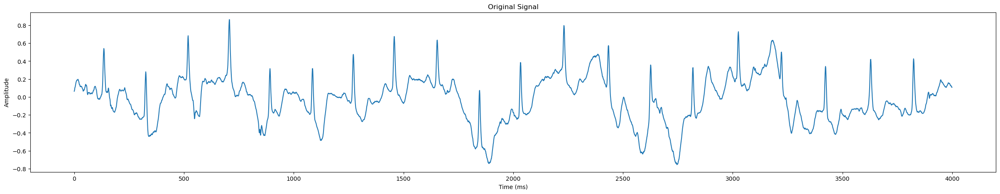

In [172]:
plt.figure(figsize=(30, 5))
plt.subplot()
plt.plot(segments[0][:4000])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

# Denoise

In [173]:
def denoise_signal_1(signal, wavelet='sym5', level=5):
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    coeffs[1:] = [pywt.threshold(c, np.std(c) * 0.5, mode='soft') for c in coeffs[1:]]  # Denoising
    return pywt.waverec(coeffs, wavelet)

In [174]:
sig_denoised_ex_1 = denoise_signal_1(segments[0])

In [175]:
sig_denoised_ex_1

array([nan, nan, nan, ..., nan, nan, nan])

In [176]:
segments[0]

array([ 0.06375,  0.0725 ,  0.08375, ..., -0.32125, -0.37   , -0.4325 ])

In [177]:
def denoise_signal_2(X, dwt_transform, dlevels, cutoff_low, cutoff_high):
    coeffs = pywt.wavedec(X, dwt_transform, level=dlevels)   # wavelet transform 'bior4.4'
    # scale 0 to cutoff_low 
    for ca in range(0,cutoff_low):
        coeffs[ca]=np.multiply(coeffs[ca],[0.0])
    # scale cutoff_high to end
    for ca in range(cutoff_high, len(coeffs)):
        coeffs[ca]=np.multiply(coeffs[ca],[0.0])
    Y = pywt.waverec(coeffs, dwt_transform) # inverse wavelet transform
    return Y  

In [178]:
sig_denoised_ex_2 = denoise_signal_2(segments[0],'bior4.4', 9 , 1 , 7)

In [179]:
sig_denoised_ex_2

array([ 0.0548939 ,  0.05662946,  0.05910374, ..., -0.10260343,
       -0.11353828, -0.12216029])

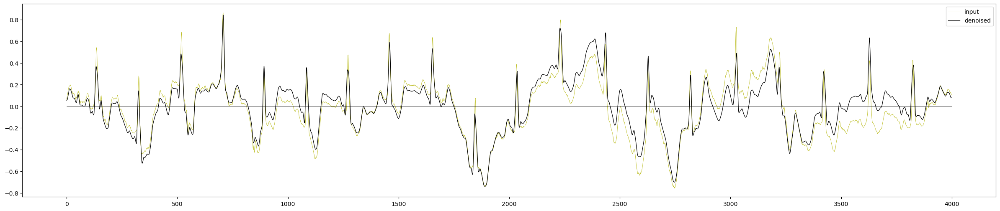

In [180]:
plt.figure(figsize=(30,6))

plt.plot(segments[0][0:4000], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_2[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

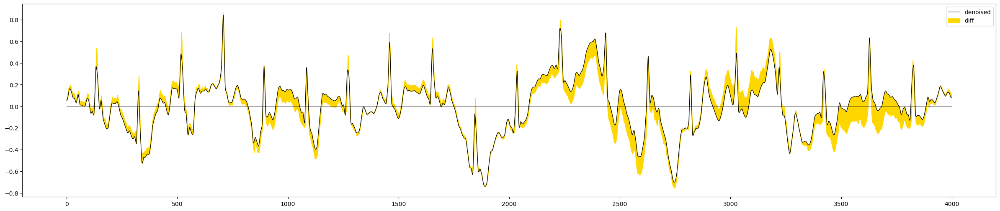

In [181]:
plt.figure(figsize=(30,6))
plt.plot(sig_denoised_ex_2[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,4000,1),segments[0][0:4000],sig_denoised_ex_2[0:4000],color='gold',label = 'diff')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [182]:
sig_denoised_ex_3 = denoise_signal_2(segments[0],'sym5', 8 , 0 , 7) # 8 level fine (8, 0, 7)

In [183]:
sig_denoised_ex_3

array([ 0.07395723,  0.07572329,  0.08102017, ..., -0.36336975,
       -0.39482023, -0.3958204 ])

In [184]:
segments[0]

array([ 0.06375,  0.0725 ,  0.08375, ..., -0.32125, -0.37   , -0.4325 ])

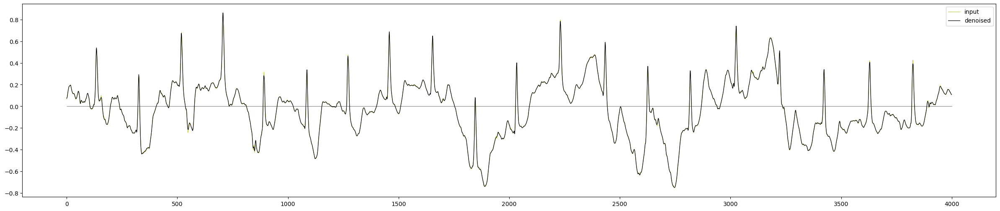

In [185]:
plt.figure(figsize=(30,6))

plt.plot(segments[0][0:4000], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_3[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

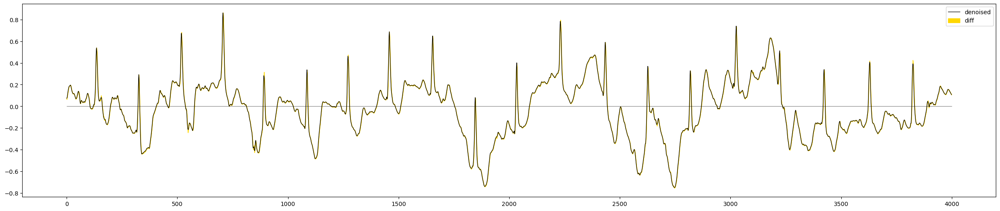

In [186]:
plt.figure(figsize=(30,6))
plt.plot(sig_denoised_ex_3[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,4000,1),segments[0][0:4000],sig_denoised_ex_3[0:4000],color='gold',label = 'diff')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [4]:
print(pywt.families())

NameError: name 'pywt' is not defined

In [188]:
pywt.wavelist('bior')

['bior1.1',
 'bior1.3',
 'bior1.5',
 'bior2.2',
 'bior2.4',
 'bior2.6',
 'bior2.8',
 'bior3.1',
 'bior3.3',
 'bior3.5',
 'bior3.7',
 'bior3.9',
 'bior4.4',
 'bior5.5',
 'bior6.8']

In [189]:
sig_denoised_ex_4 = denoise_signal_2(segments[0],'bior5.5', 9 , 1 , 7) # 8 level fine (8, 0, 7)

In [190]:
sig_denoised_ex_4

array([ 0.055937  ,  0.05858036,  0.0615115 , ..., -0.1373975 ,
       -0.15317092, -0.16294711])

In [191]:
segments[0]

array([ 0.06375,  0.0725 ,  0.08375, ..., -0.32125, -0.37   , -0.4325 ])

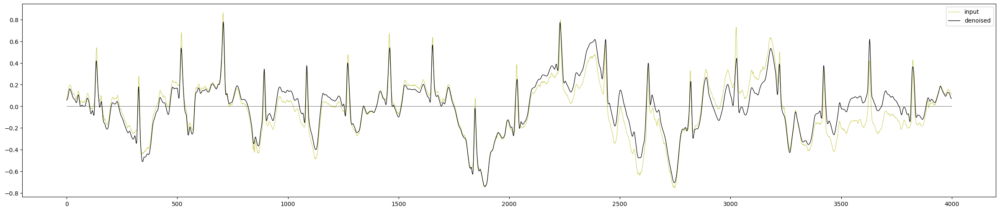

In [192]:
plt.figure(figsize=(30,6))

plt.plot(segments[0][0:4000], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_4[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

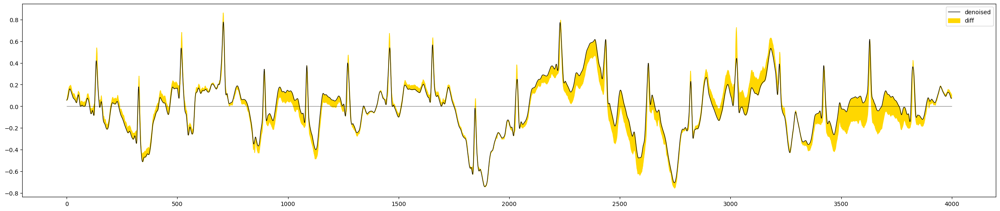

In [193]:
plt.figure(figsize=(30,6))
plt.plot(sig_denoised_ex_4[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,4000,1),segments[0][0:4000],sig_denoised_ex_4[0:4000],color='gold',label = 'diff')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [194]:
sig_denoised_ex_5 = denoise_signal_2(segments[0],'sym3', 9 , 1 , 7) # 8 level fine (8, 0, 7)

In [195]:
segments[0]

array([ 0.06375,  0.0725 ,  0.08375, ..., -0.32125, -0.37   , -0.4325 ])

In [196]:
sig_denoised_ex_5

array([ 0.05903814,  0.06155426,  0.06448126, ..., -0.13143829,
       -0.14697334, -0.1592663 ])

In [197]:
pywt.wavelist('sym')

['sym2',
 'sym3',
 'sym4',
 'sym5',
 'sym6',
 'sym7',
 'sym8',
 'sym9',
 'sym10',
 'sym11',
 'sym12',
 'sym13',
 'sym14',
 'sym15',
 'sym16',
 'sym17',
 'sym18',
 'sym19',
 'sym20']

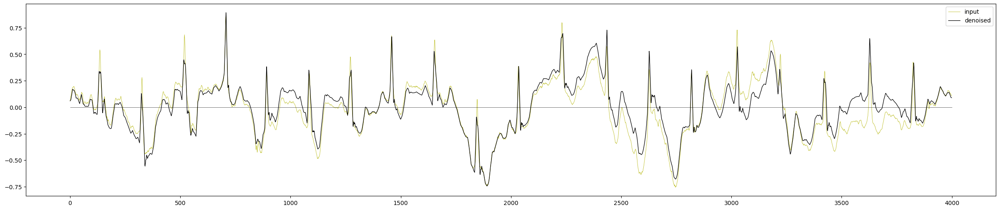

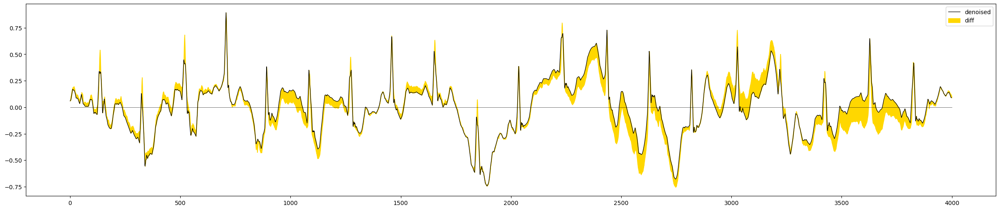

In [198]:
plt.figure(figsize=(30,6))

plt.plot(segments[0][0:4000], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_5[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

plt.figure(figsize=(30,6))
plt.plot(sig_denoised_ex_5[0:4000], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,4000,1),segments[0][0:4000],sig_denoised_ex_5[0:4000],color='gold',label = 'diff')
plt.hlines(0,0,4000,color='black', linewidth=0.4)
plt.legend()
plt.show()

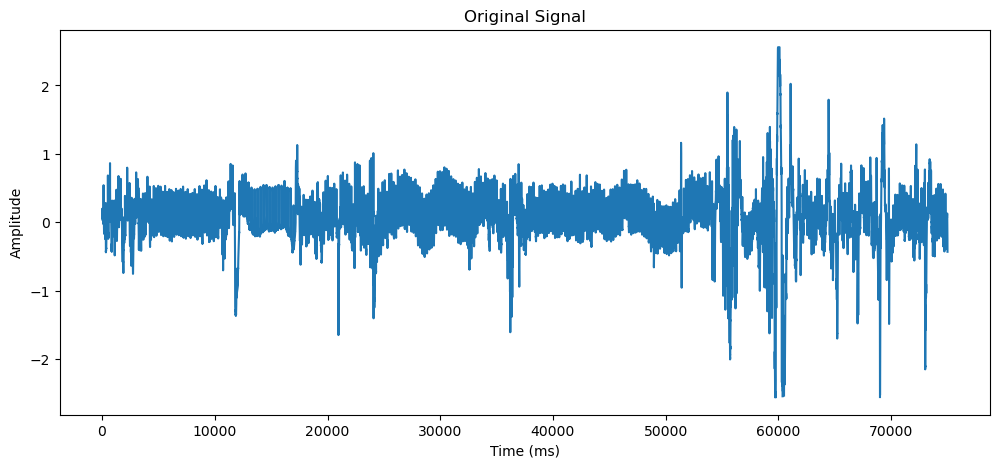

In [199]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(segments[0])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

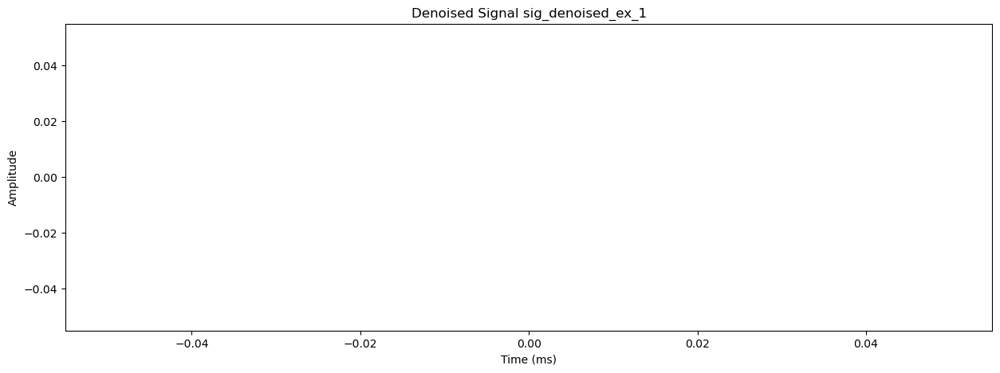

In [200]:
plt.figure(figsize=(15, 5))
plt.subplot()
plt.plot(sig_denoised_ex_1)
plt.title('Denoised Signal sig_denoised_ex_1')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

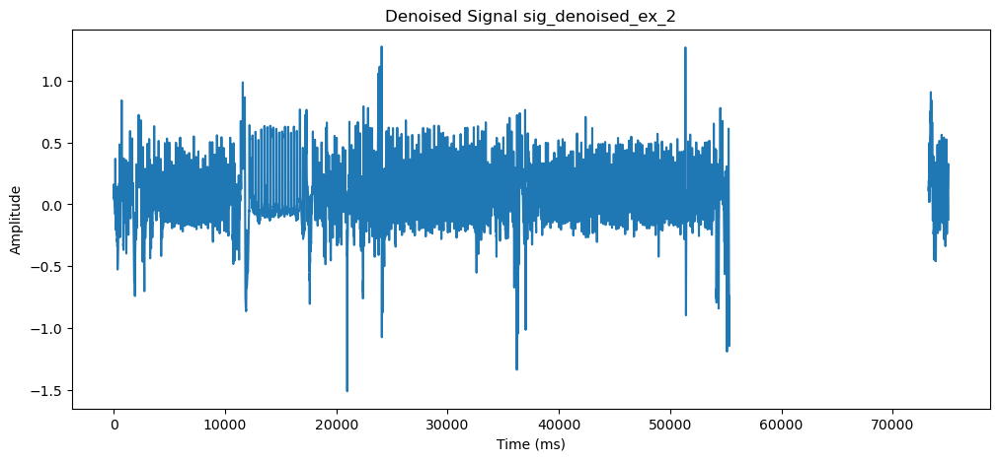

In [201]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_2)
plt.title('Denoised Signal sig_denoised_ex_2')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

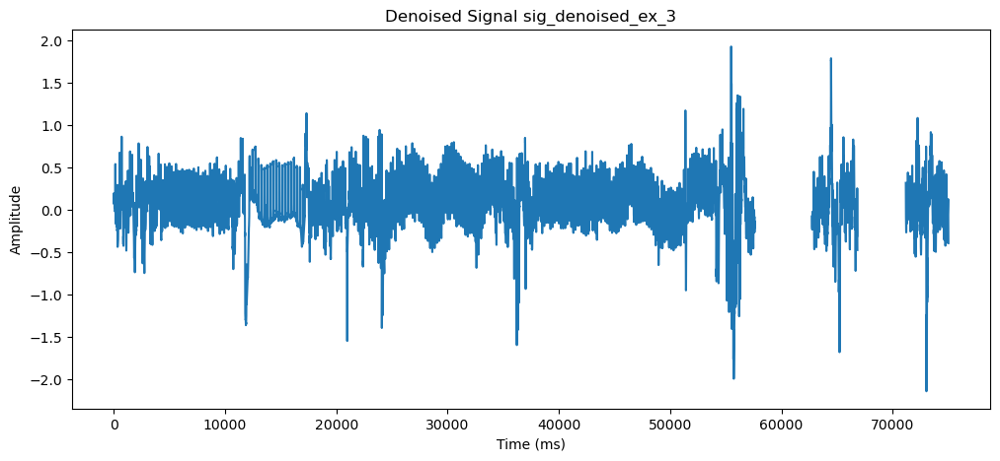

In [202]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_3)
plt.title('Denoised Signal sig_denoised_ex_3')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

In [203]:
sig_denoised_ex_3[55000:60000]

array([0.0963711 , 0.05656734, 0.02263326, ...,        nan,        nan,
              nan])

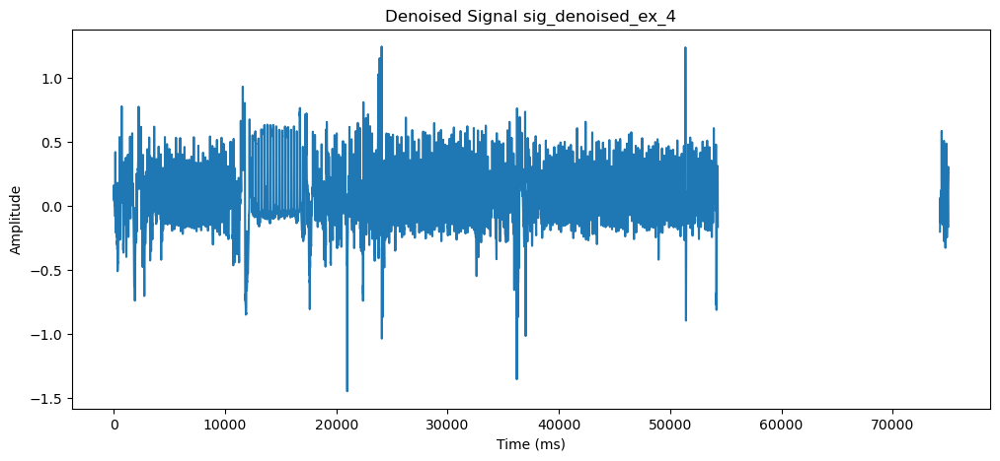

In [204]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_4)
plt.title('Denoised Signal sig_denoised_ex_4')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

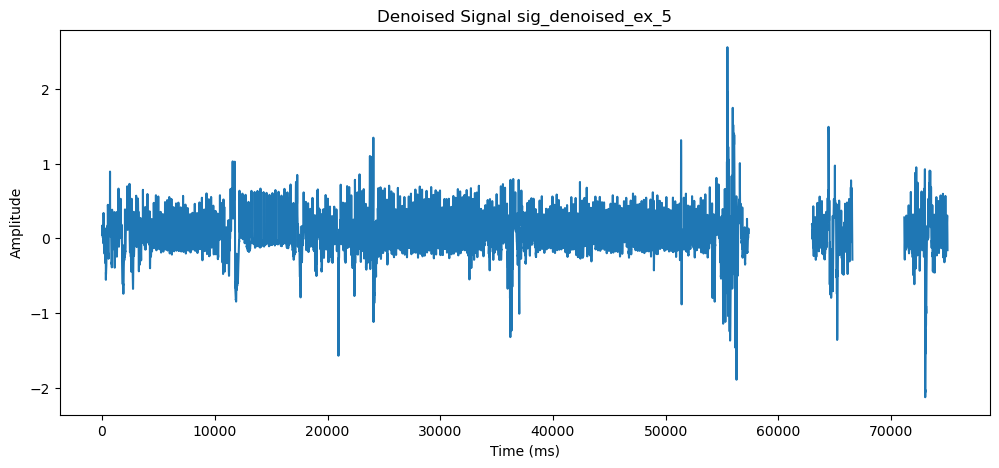

In [205]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_5)
plt.title('Denoised Signal sig_denoised_ex_5')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

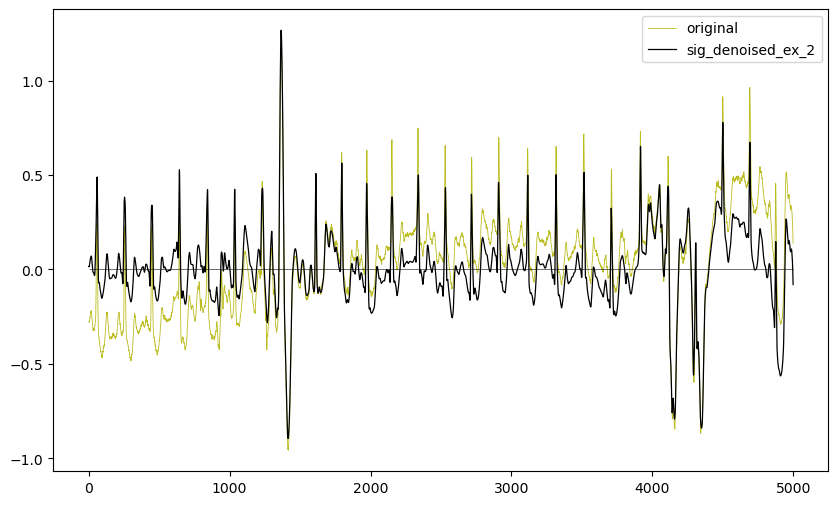

In [206]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][50000:55000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_2[50000:55000], color='black', linewidth=0.9,label = 'sig_denoised_ex_2')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()

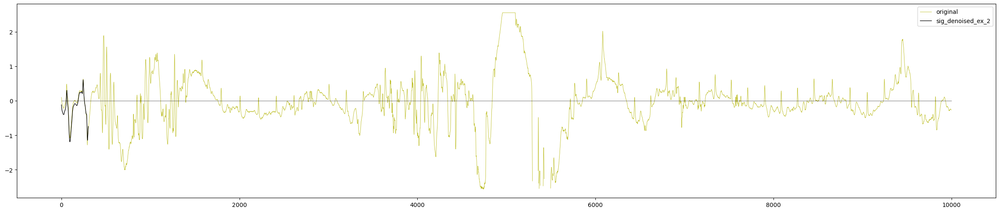

In [207]:
plt.figure(figsize=(30,6))

plt.plot(segments[0][55000:65000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_2[55000:65000], color='black', linewidth=0.9,label = 'sig_denoised_ex_2')
plt.hlines(0,0,10000,color='black', linewidth=0.4)
plt.legend()
plt.show()

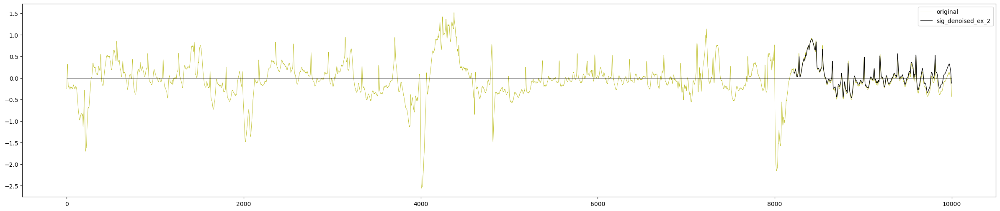

In [208]:
plt.figure(figsize=(30,6))

plt.plot(segments[0][65000:75000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_2[65000:75000], color='black', linewidth=0.9,label = 'sig_denoised_ex_2')
plt.hlines(0,0,10000,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [209]:
segments[0][74995:750221]

array([-0.24375, -0.28375, -0.32125, -0.37   , -0.4325 ])

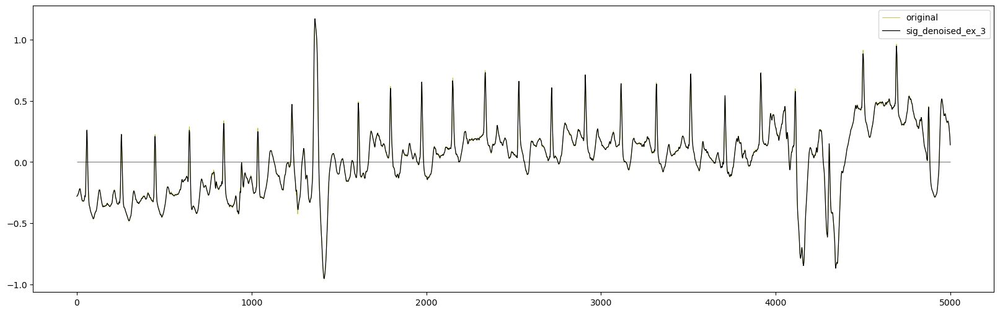

In [210]:
plt.figure(figsize=(20,6))

plt.plot(segments[0][50000:55000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_3[50000:55000], color='black', linewidth=0.9,label = 'sig_denoised_ex_3')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()

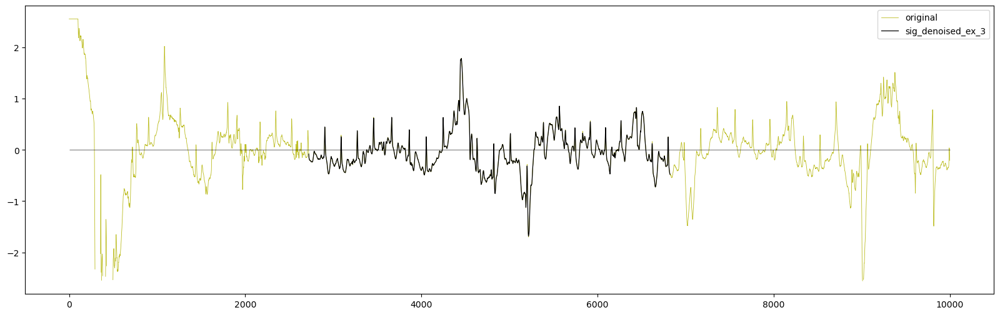

In [211]:
plt.figure(figsize=(20,6))

plt.plot(segments[0][60000:70000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_3[60000:70000], color='black', linewidth=0.9,label = 'sig_denoised_ex_3')
plt.hlines(0,0,10000,color='black', linewidth=0.4)
plt.legend()
plt.show()

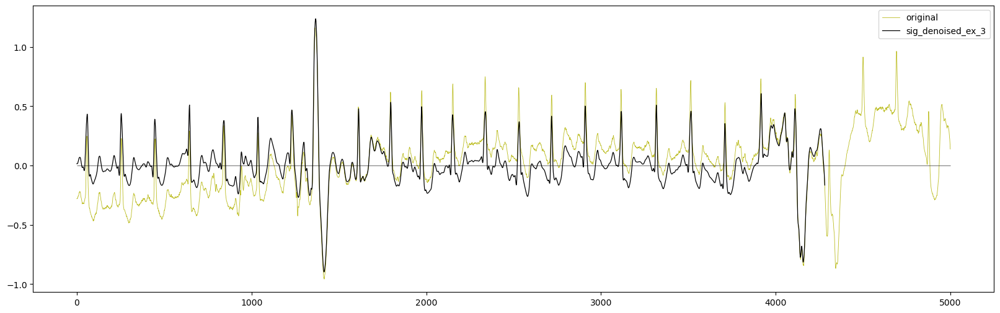

In [212]:
plt.figure(figsize=(20,6))

plt.plot(segments[0][50000:55000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_4[50000:55000], color='black', linewidth=0.9,label = 'sig_denoised_ex_3')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()

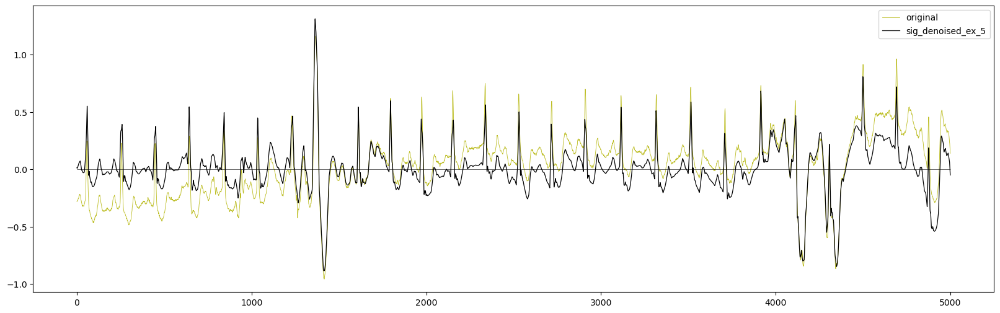

In [213]:
plt.figure(figsize=(20,6))

plt.plot(segments[0][50000:55000], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_5[50000:55000], color='black', linewidth=0.9,label = 'sig_denoised_ex_5')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [214]:
record.fs

250

# Baseline wandering

In [215]:
def get_median_filter_width(sampling_rate, duration):
    res = int( sampling_rate*duration )
    res += ((res%2) - 1) # needs to be an odd number
    return res

In [216]:
# baseline fitting by filtering
# === Define Filtering Params for Baseline fitting Leads======================

BASIC_SRATE = 250
ms_flt_array = [0.2,0.6]    #<-- length of baseline fitting filters (in seconds)
mfa = np.zeros(len(ms_flt_array), dtype='int')
for i in range(0, len(ms_flt_array)):
    mfa[i] = get_median_filter_width(BASIC_SRATE,ms_flt_array[i])

In [217]:
mfa

array([ 49, 149])

In [218]:
def filter_signal(X):
    global mfa
    X0 = X  #read orignal signal
    for mi in range(0,len(mfa)):
        X0 = medfilt(X0,mfa[mi]) # apply median filter one by one on top of each other
    X0 = np.subtract(X,X0)  # finally subtract from orignal signal
    return X0

In [219]:
signal_flt_ex_2 = filter_signal(sig_denoised_ex_2)
signal_flt_ex_2.shape

(75000,)

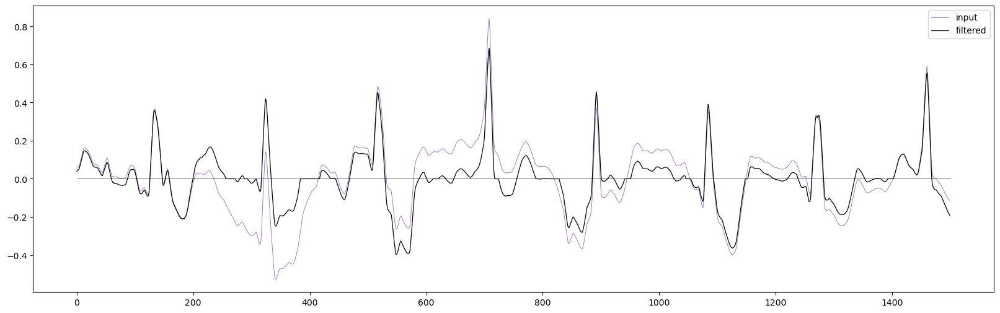

In [220]:
plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_2[:1500], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_2[:1500], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()

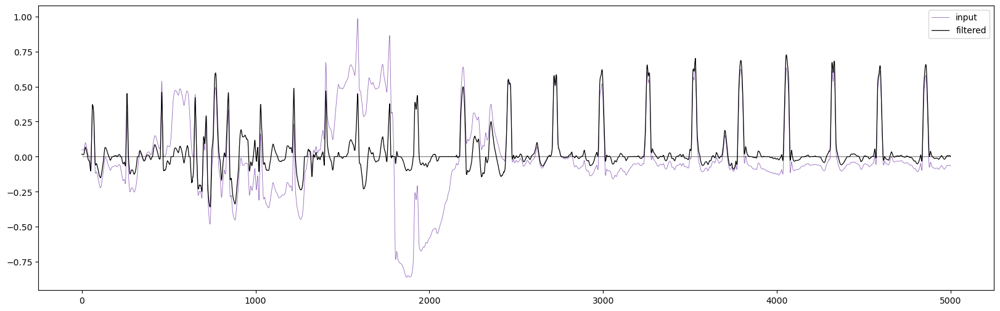

In [221]:
plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_2[10000:15000], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_2[10000:15000], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [222]:
signal_flt_ex_3 = filter_signal(sig_denoised_ex_3)
signal_flt_ex_3.shape

(75000,)

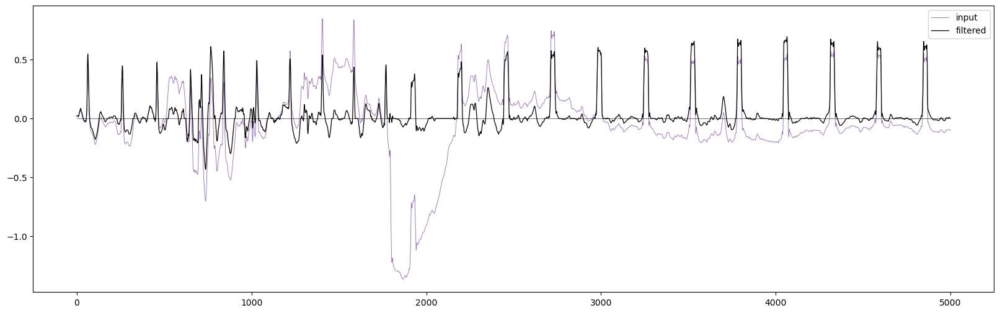

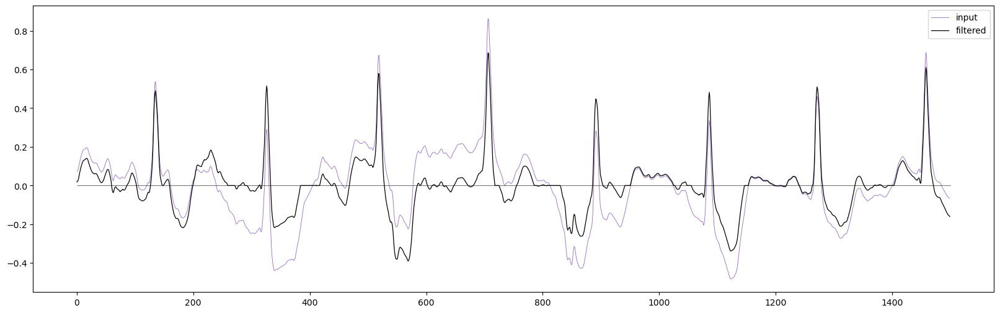

In [223]:
plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_3[10000:15000], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_3[10000:15000], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()


plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_3[:1500], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_3[:1500], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()

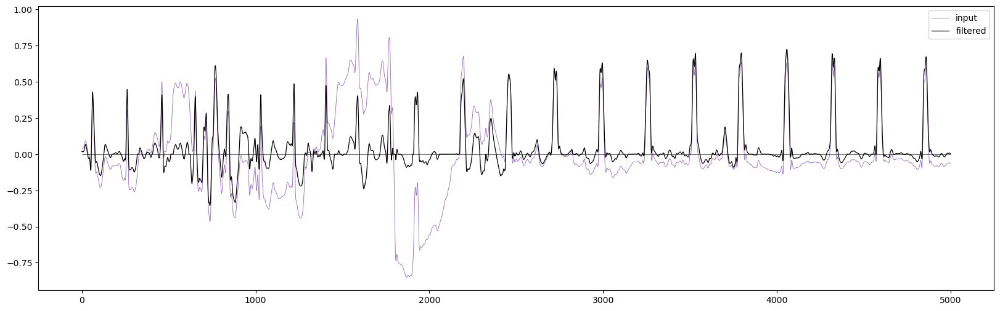

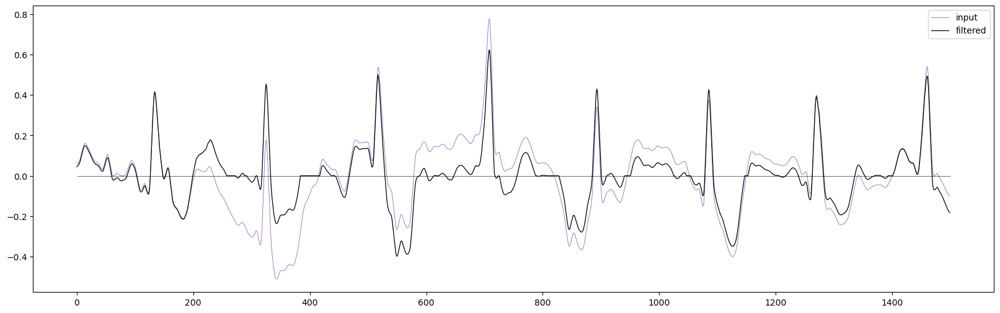

In [224]:
signal_flt_ex_4 = filter_signal(sig_denoised_ex_4)

plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_4[10000:15000], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_4[10000:15000], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()


plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_4[:1500], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_4[:1500], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()

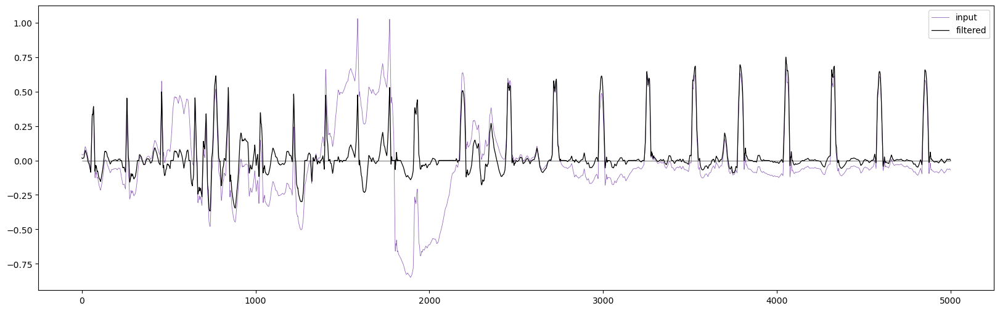

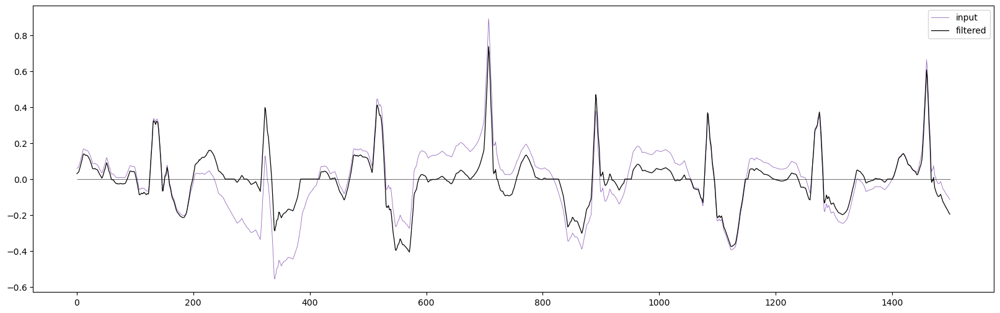

In [229]:
signal_flt_ex_5 = filter_signal(sig_denoised_ex_5)

plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_5[10000:15000], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_5[10000:15000], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,5000,color='black', linewidth=0.4)
plt.legend()
plt.show()


plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_5[:1500], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_5[:1500], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()

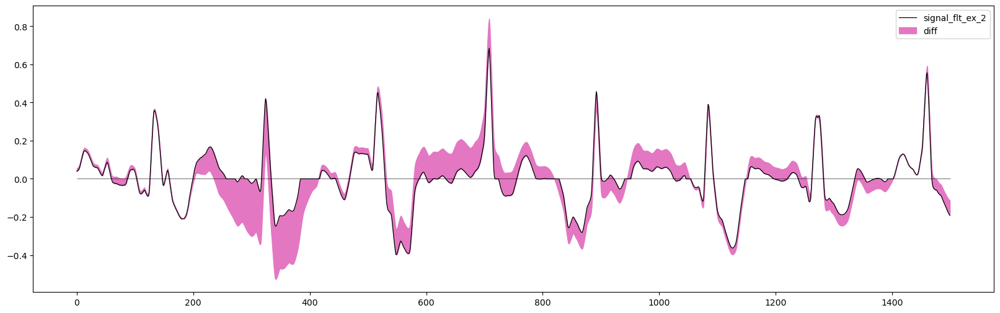

In [225]:
plt.figure(figsize=(20,6))
plt.plot(signal_flt_ex_2[:1500], color='black', linewidth=0.9,label = 'signal_flt_ex_2')
plt.fill_between(np.arange(0,1500,1),sig_denoised_ex_2[:1500],signal_flt_ex_2[:1500],color='tab:pink',label = 'diff')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()

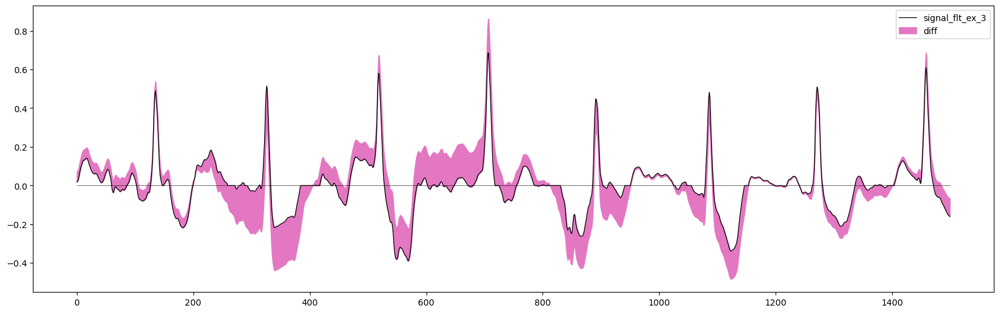

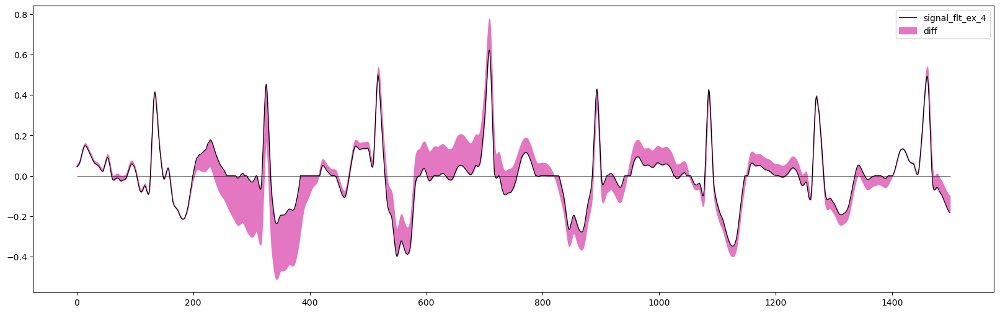

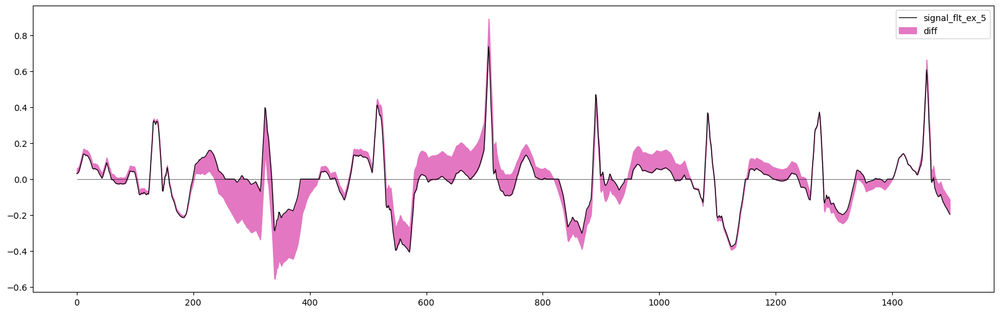

In [230]:
plt.figure(figsize=(20,6))
plt.plot(signal_flt_ex_3[:1500], color='black', linewidth=0.9,label = 'signal_flt_ex_3')
plt.fill_between(np.arange(0,1500,1),sig_denoised_ex_3[:1500],signal_flt_ex_3[:1500],color='tab:pink',label = 'diff')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()


plt.figure(figsize=(20,6))
plt.plot(signal_flt_ex_4[:1500], color='black', linewidth=0.9,label = 'signal_flt_ex_4')
plt.fill_between(np.arange(0,1500,1),sig_denoised_ex_4[:1500],signal_flt_ex_4[:1500],color='tab:pink',label = 'diff')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()


plt.figure(figsize=(20,6))
plt.plot(signal_flt_ex_5[:1500], color='black', linewidth=0.9,label = 'signal_flt_ex_5')
plt.fill_between(np.arange(0,1500,1),sig_denoised_ex_5[:1500],signal_flt_ex_5[:1500],color='tab:pink',label = 'diff')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.legend()
plt.show()

# R peak detect

In [231]:
from ecgdetectors import Detectors
BASIC_SRATE = 250

In [232]:
signal_pad_samples = 10
signal_pad = np.zeros(signal_pad_samples) # pad one sec to detect initial peaks properly
signalf_ex_2 = signal_flt_ex_2
detectors = Detectors(BASIC_SRATE)

In [233]:
detectors = {
            'pan_tompkins_detector':[detectors.pan_tompkins_detector, []],
            'hamilton_detector':[detectors.hamilton_detector, []],
            'christov_detector':[detectors.christov_detector, []],
            'engzee_detector':[detectors.engzee_detector, []],
            'swt_detector':[detectors.swt_detector, []],
            'two_average_detector':[detectors.two_average_detector, []],
            }

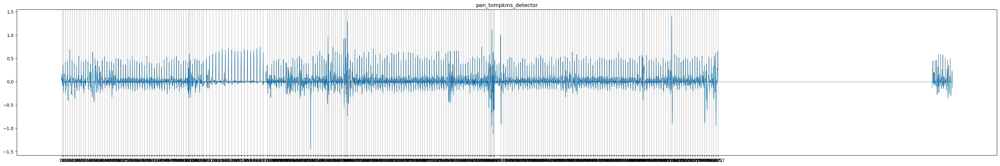

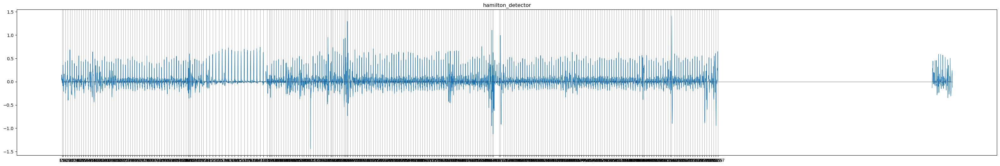

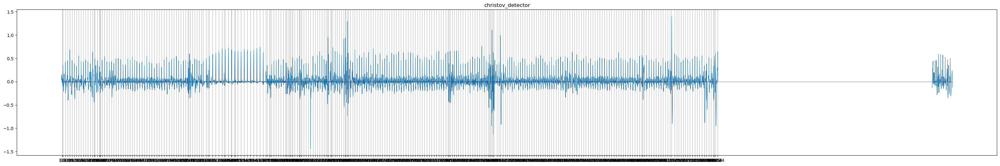

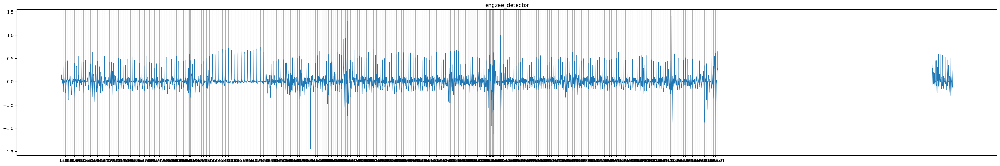

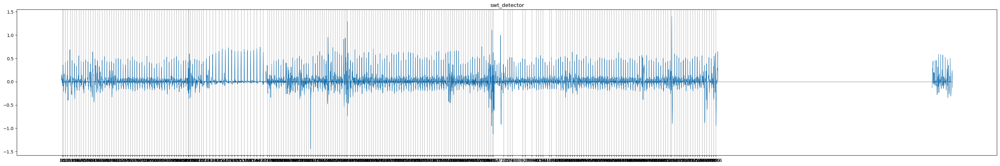

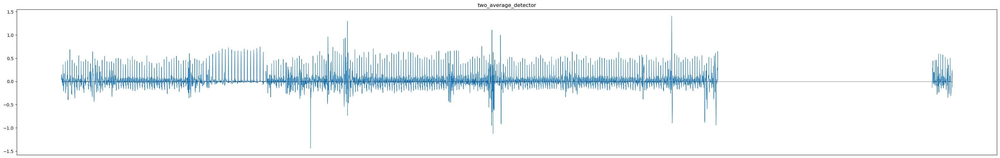

In [235]:
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_2)))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_2,color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,75000,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

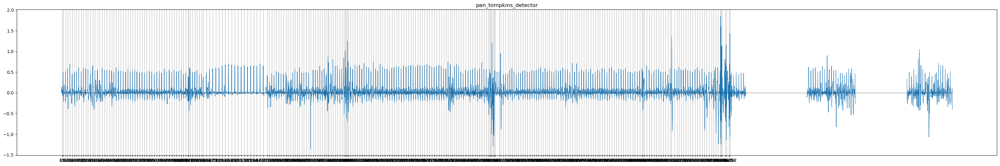

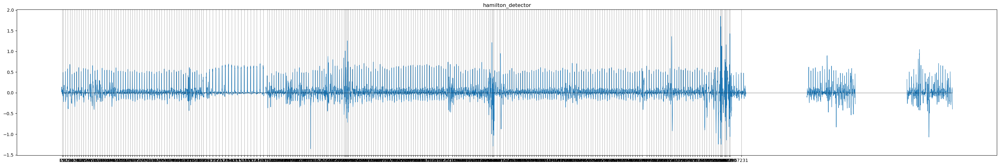

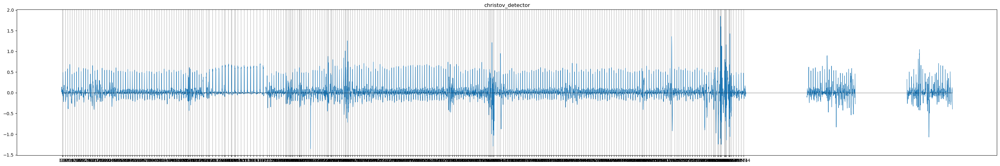

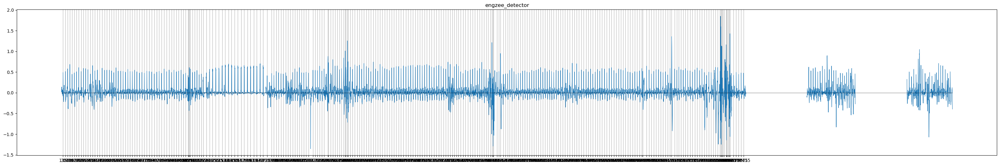

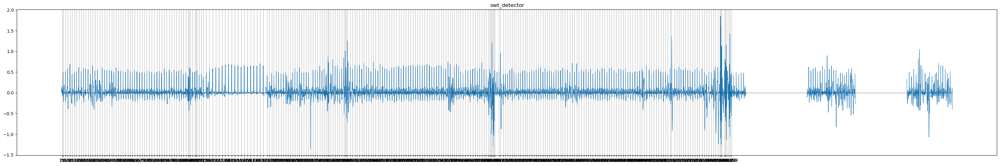

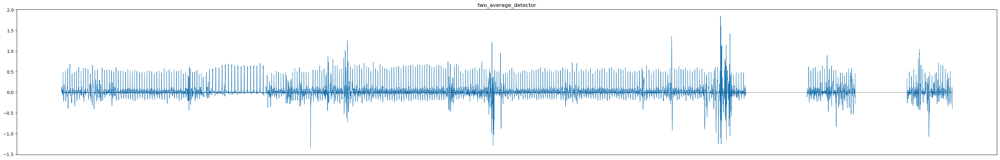

In [236]:
signalf_ex_3 = signal_flt_ex_3

for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_3)))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_3,color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,75000,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

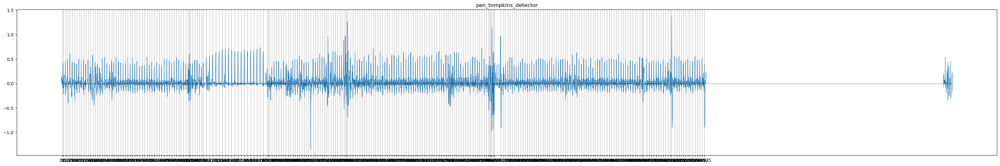

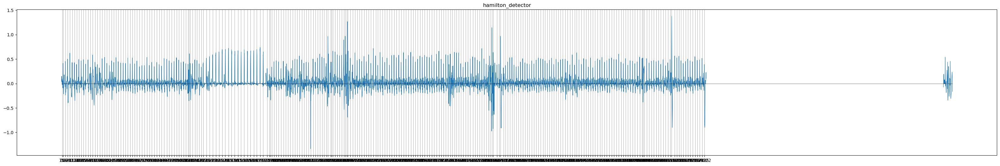

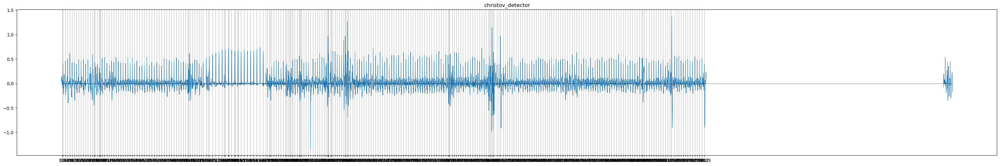

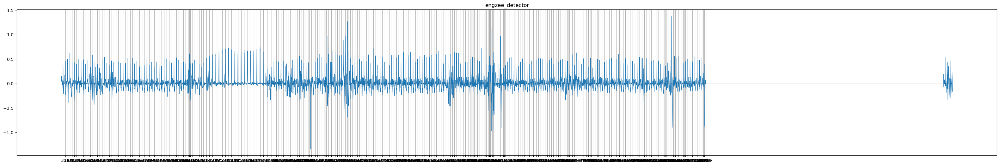

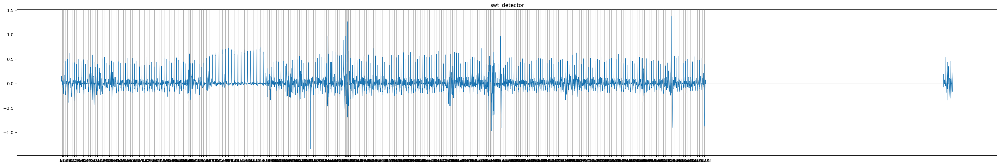

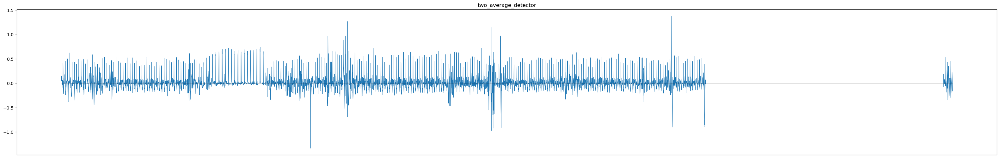

In [237]:
signalf_ex_4 = signal_flt_ex_4

for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_4)))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_4,color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,75000,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

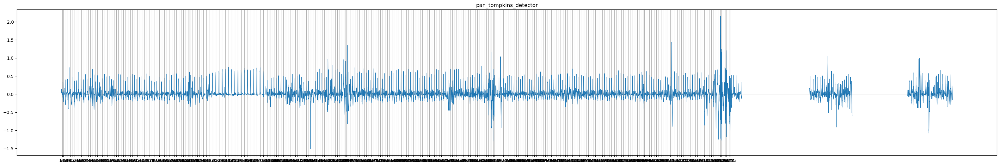

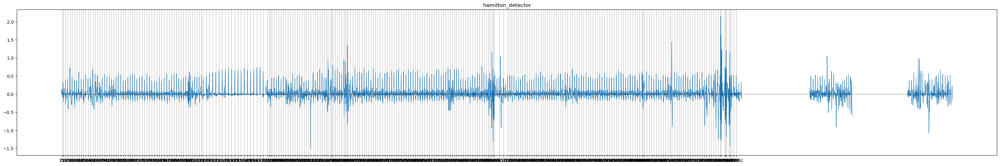

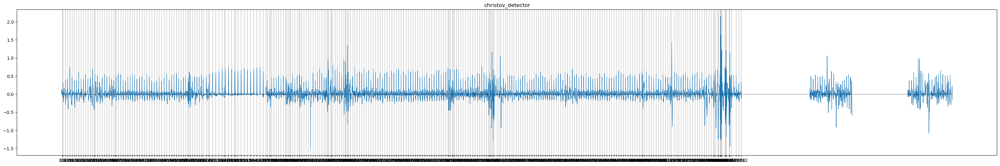

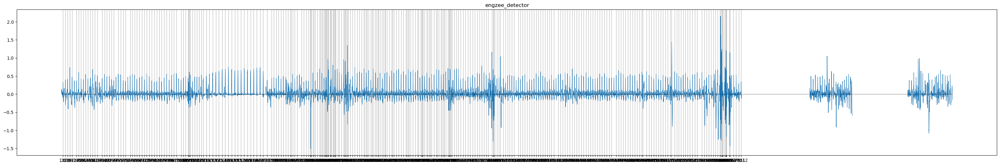

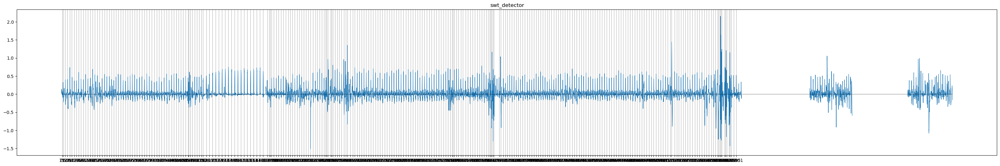

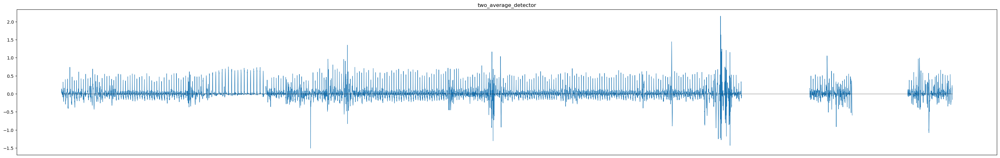

In [238]:
signalf_ex_5 = signal_flt_ex_5

for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_5)))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_5,color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,75000,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

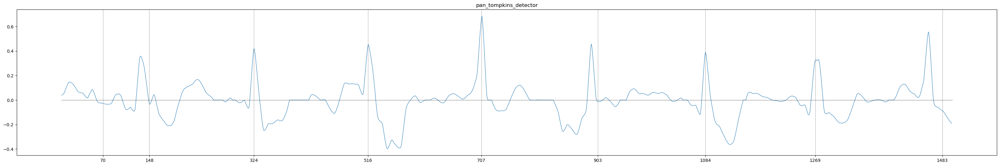

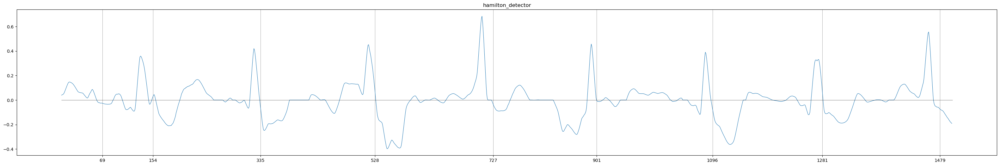

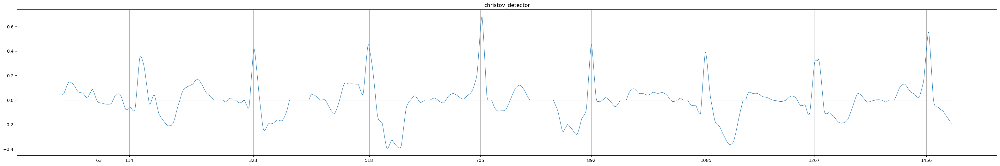

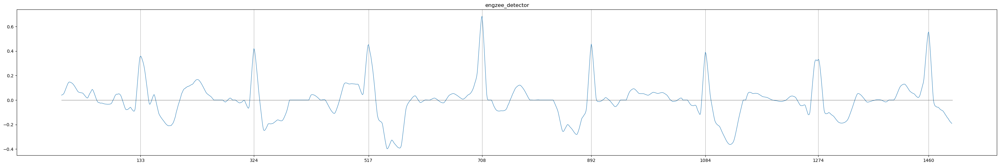

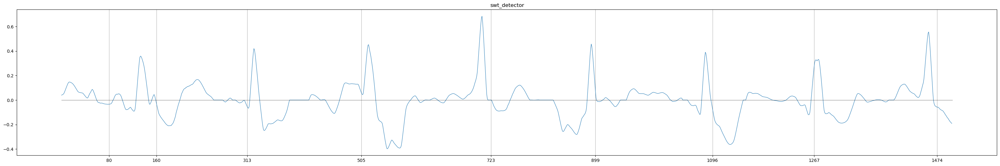

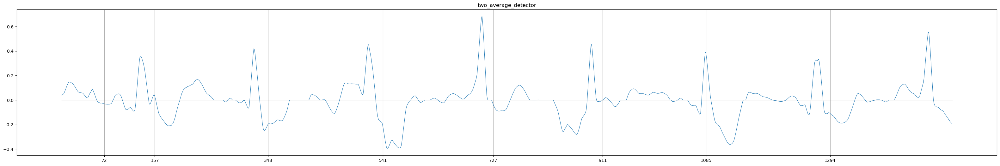

In [239]:
signalf_ex_2_2 = signal_flt_ex_2
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_2[:1500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_2_2[:1500],color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,1500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

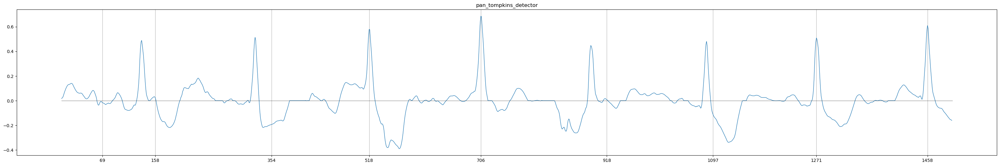

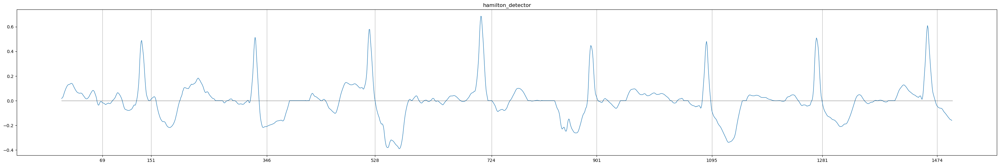

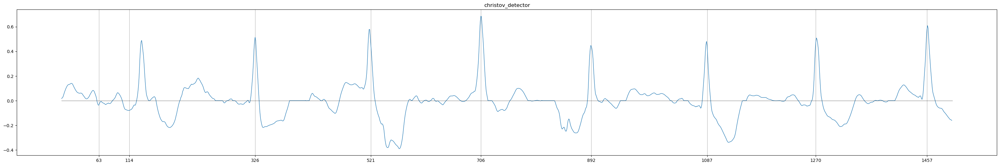

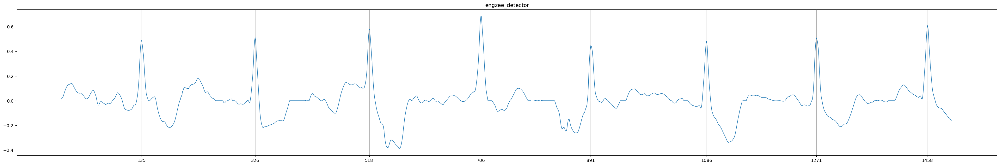

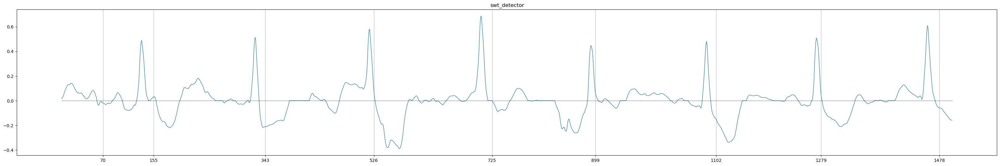

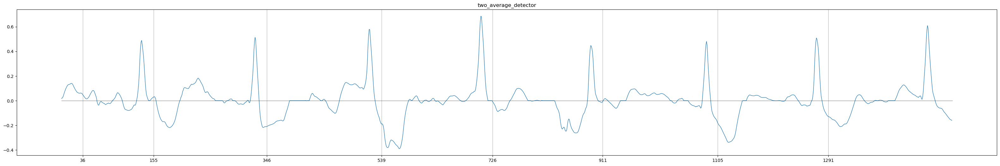

In [241]:
signalf_ex_3_3 = signal_flt_ex_3
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_3[:1500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_3_3[:1500],color='tab:blue',linewidth=0.95)
    plt.hlines(0,0,1500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

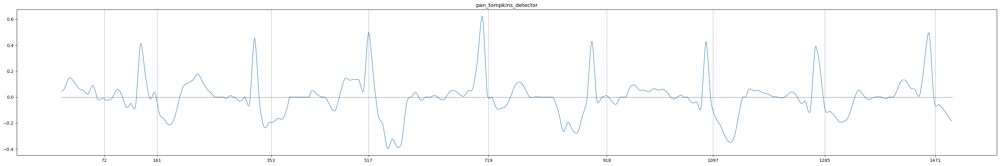

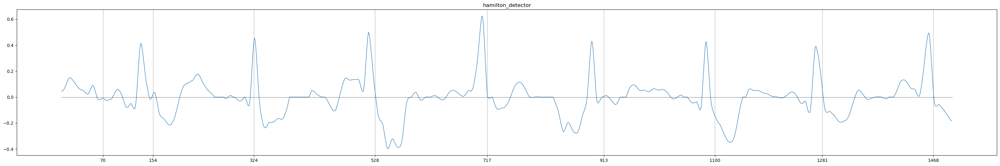

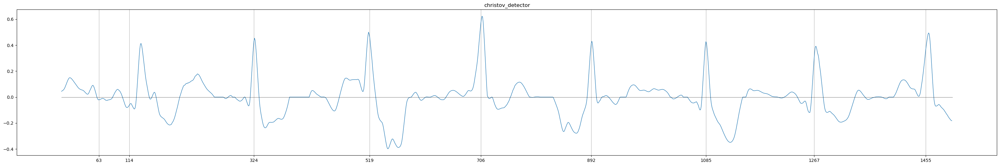

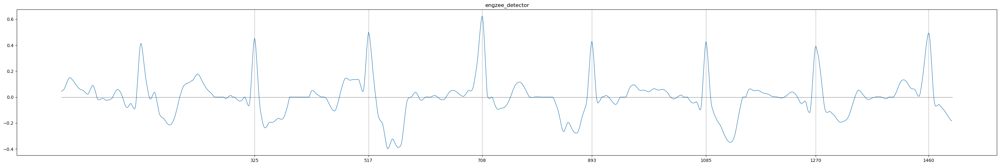

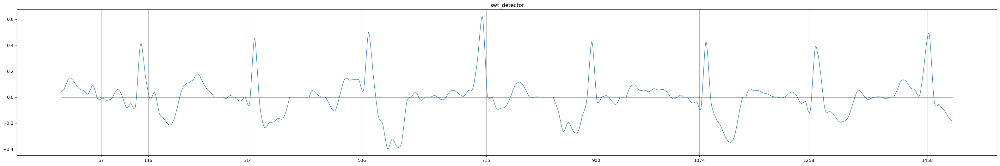

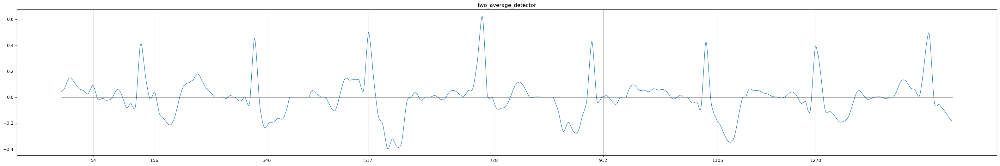

In [242]:
signalf_ex_4_4 = signal_flt_ex_4
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_4[:1500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_4_4[:1500],color='tab:blue',linewidth=0.95)
    plt.hlines(0,0,1500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

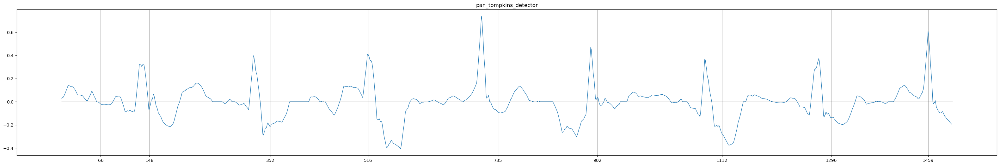

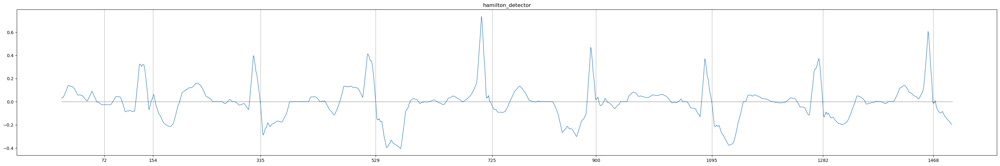

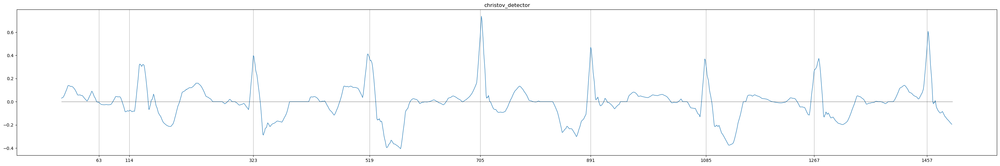

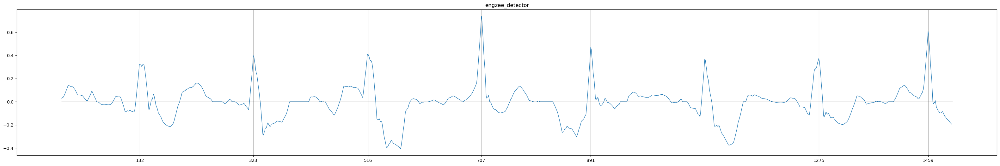

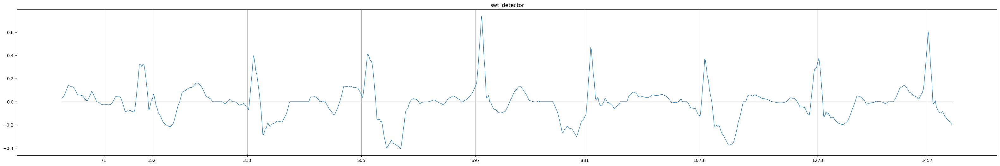

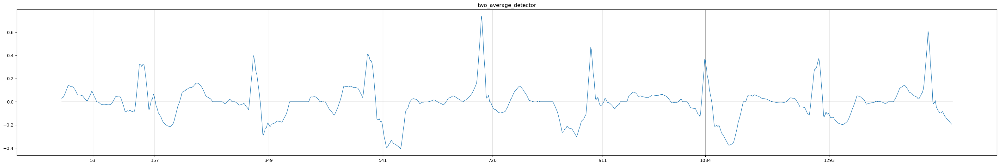

In [243]:
signalf_ex_5_5 = signal_flt_ex_5
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_5[:1500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_5_5[:1500],color='tab:blue',linewidth=0.95)
    plt.hlines(0,0,1500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

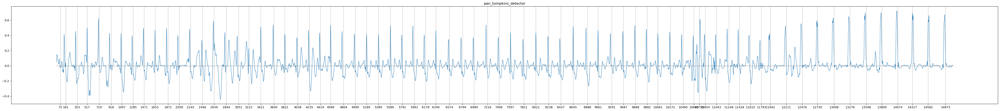

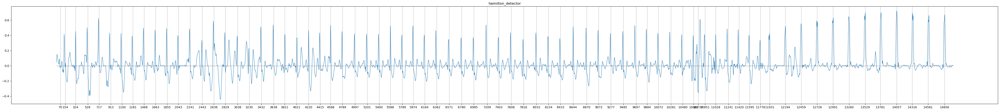

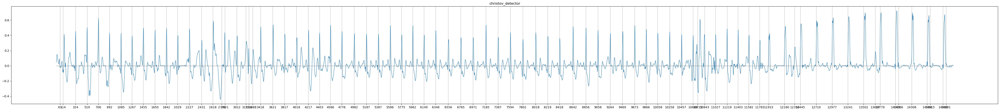

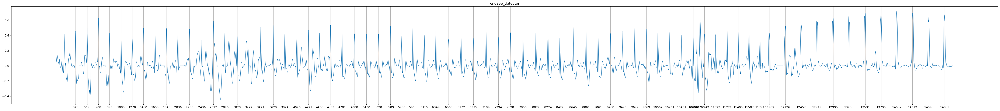

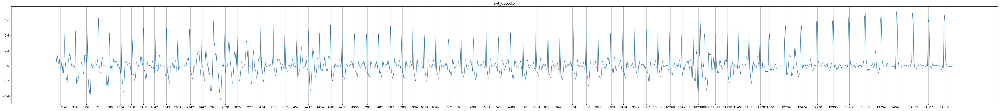

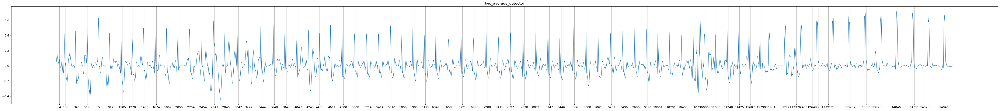

In [246]:
signalf_ex_4_4 = signal_flt_ex_4
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_4[:15000])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(60,6))
    plt.title(kd)
    plt.plot(signalf_ex_4_4[:15000],color='tab:blue',linewidth=0.95)
    plt.hlines(0,0,15000,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

In [247]:
detectors['engzee_detector'][1]

array([  325,   517,   708,   893,  1085,  1270,  1460,  1653,  1845,
        2036,  2230,  2436,  2629,  2820,  3028,  3222,  3421,  3629,
        3824,  4026,  4221,  4406,  4589,  4781,  4988,  5190,  5390,
        5589,  5780,  5965,  6155,  6349,  6563,  6772,  6975,  7189,
        7394,  7598,  7806,  8022,  8224,  8422,  8645,  8861,  9061,
        9268,  9476,  9677,  9869, 10062, 10261, 10461, 10653, 10716,
       10768, 10842, 11029, 11221, 11405, 11587, 11771, 11932, 12196,
       12457, 12719, 12995, 13255, 13531, 13795, 14057, 14319, 14595,
       14859])

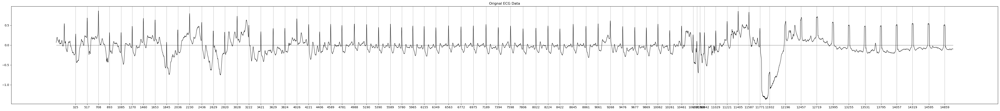

In [248]:
data_signal_4 = signalf_ex_4_4
data_peaks_4 = detectors['engzee_detector'][1]

plt.figure(figsize=(60,6))
plt.title('Orignal ECG Data')
plt.plot(segments[0][:15000],color='black',linewidth=0.9)
plt.hlines(0,0,15000,color='black', linewidth=0.5)
plt.xticks(data_peaks_4)
plt.grid(axis='x')
plt.show()

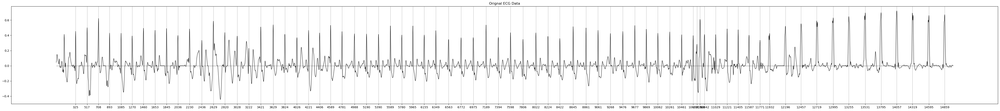

In [249]:
plt.figure(figsize=(60,6))
plt.title('Orignal ECG Data')
plt.plot(data_signal_4[:15000],color='black',linewidth=0.9)
plt.hlines(0,0,15000,color='black', linewidth=0.5)
plt.xticks(data_peaks_4)
plt.grid(axis='x')
plt.show()

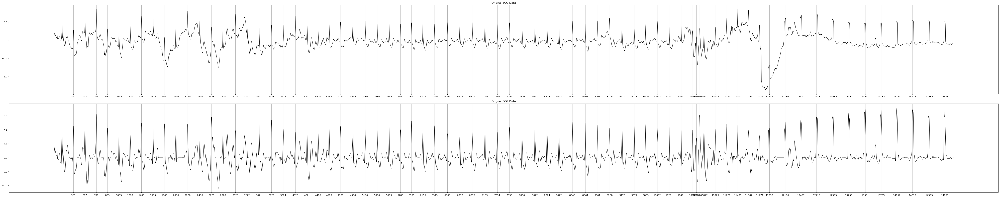

In [255]:
plt.figure(figsize=(60,12))

plt.subplot(2, 1, 1)

plt.title('Orignal ECG Data')
plt.plot(segments[0][:15000],color='black',linewidth=0.9)
plt.hlines(0,0,15000,color='black', linewidth=0.5)
plt.xticks(data_peaks_4)
plt.grid(axis='x')

plt.subplot(2, 1, 2)
plt.title('Orignal ECG Data')
plt.plot(data_signal_4[:15000],color='black',linewidth=0.9)
plt.hlines(0,0,15000,color='black', linewidth=0.5)
plt.xticks(data_peaks_4)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

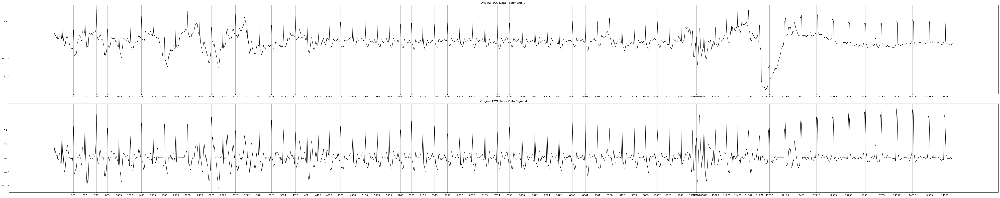

In [254]:

plt.figure(figsize=(60, 12))  # Adjusted height to fit both plots

# First plot
plt.subplot(2, 1, 1)
plt.title('Original ECG Data - Segments[0]')
plt.plot(segments[0][:15000], color='black', linewidth=0.9)
plt.hlines(0, 0, 15000, color='black', linewidth=0.5)
plt.xticks(data_peaks_4)
plt.grid(axis='x')

# Second plot
plt.subplot(2, 1, 2)
plt.title('Original ECG Data - Data Signal 4')
plt.plot(data_signal_4[:15000], color='black', linewidth=0.9)
plt.hlines(0, 0, 15000, color='black', linewidth=0.5)
plt.xticks(data_peaks_4)
plt.grid(axis='x')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()


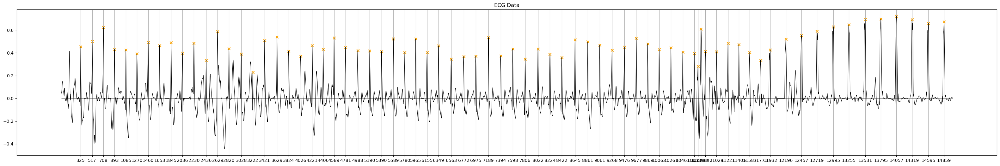

In [270]:
plt.figure(figsize=(40,6))
plt.title('ECG Data')
plt.plot(data_signal_4[:15000],color='black',linewidth=0.8)
plt.scatter(data_peaks_4, data_signal_4[:15000][data_peaks_4], color='orange', marker='x', label='R-peaks')
plt.hlines(0,0,15000,color='black', linewidth=0.4)
plt.xticks(data_peaks_4)
plt.grid(axis='x')
plt.show()


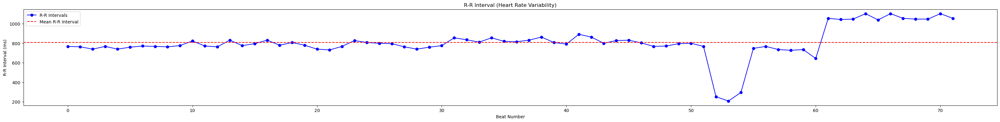

In [271]:
# Compute R-R Intervals (in milliseconds)
def compute_rr_intervals(r_peaks, fs=250):
    rr_intervals = np.diff(r_peaks) * (1000 / fs)  # Convert to milliseconds
    return rr_intervals

# Apply RR interval calculation
rr_intervals = compute_rr_intervals(data_peaks_4)

# Plot RR Intervals
plt.figure(figsize=(40, 4))
plt.plot(rr_intervals, marker='o', linestyle='-', color='b', label='R-R Intervals')
plt.axhline(np.mean(rr_intervals), color='r', linestyle='--', label='Mean R-R Interval')
plt.xlabel('Beat Number')
plt.ylabel('R-R Interval (ms)')
plt.title('R-R Interval (Heart Rate Variability)')
plt.legend()
plt.show()

In [272]:
import numpy as np

# Function to calculate HRV time-domain features
def compute_hrv_features(rr_intervals):
    features = {}

    # Time-domain HRV features
    features['Mean_RR'] = np.mean(rr_intervals)
    features['SDNN'] = np.std(rr_intervals)  # Standard deviation of RR intervals
    features['RMSSD'] = np.sqrt(np.mean(np.diff(rr_intervals) ** 2))  # Root mean square of successive differences
    features['pNN50'] = np.sum(np.abs(np.diff(rr_intervals)) > 50) / len(rr_intervals) * 100  # Percentage of NN50

    return features

# Compute HRV features
hrv_features = compute_hrv_features(rr_intervals)

# Print HRV features
print("HRV Features:")
for key, value in hrv_features.items():
    print(f"{key}: {value:.3f}")


HRV Features:
Mean_RR: 807.444
SDNN: 157.575
RMSSD: 102.432
pNN50: 25.000
